In [9]:
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
import torch.nn.functional as F
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [3]:
class VOCSegmentationDataset(Dataset):
    def __init__(self, root_dir, year='2012', image_set='train', transform=None, colormap=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_dir = os.path.join(root_dir, 'VOCdevkit', 'VOC' + year, 'JPEGImages')
        self.mask_dir = os.path.join(root_dir, 'VOCdevkit', 'VOC' + year, 'SegmentationClass')
        self.colormap = colormap

        # Load image ids from the corresponding split text file
        split_file = os.path.join(root_dir, 'VOCdevkit', 'VOC' + year, 'ImageSets', 'Segmentation', image_set + '.txt')
        with open(split_file, 'r') as file:
            self.image_ids = file.read().split()

    def __len__(self):
        return len(self.image_ids)

    def convert_to_segmentation_mask(self, mask):
        mask_array = np.array(mask, dtype=np.int32)
        label_mask = np.zeros((mask_array.shape[0], mask_array.shape[1]), dtype=np.int32)
        for label_index, label in enumerate(self.colormap):
            matches = np.all(mask_array == label, axis=-1)
            label_mask[matches] = label_index
        return label_mask

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img_path = os.path.join(self.image_dir, img_id + '.jpg')
        mask_path = os.path.join(self.mask_dir, img_id + '.png')

        image = Image.open(img_path).convert('RGB')
        gray_image = Image.open(img_path).convert('L')
        mask = Image.open(mask_path).convert('RGB')

        if self.transform:
            gray_image = self.transform(gray_image)
            mask = self.transform (mask) 
    
        mask = self.convert_to_segmentation_mask(mask)  # Convert mask to segmentation format
        mask = torch.tensor(mask, dtype=torch.long)  # Convert to tensor
        gray_image = transforms.ToTensor()(gray_image)  # Convert image to tensor
        return gray_image, mask  


VOC_COLORMAP = [
    [0, 0, 0],
    [128, 0, 0],
    [0, 128, 0],
    [128, 128, 0],
    [0, 0, 128],
    [128, 0, 128],
    [0, 128, 128],
    [128, 128, 128],
    [64, 0, 0],
    [192, 0, 0],
    [64, 128, 0],
    [192, 128, 0],
    [64, 0, 128],
    [192, 0, 128],
    [64, 128, 128],
    [192, 128, 128],
    [0, 64, 0],
    [128, 64, 0],
    [0, 192, 0],
    [128, 192, 0],
    [0, 64, 128],
]

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(), 
])




train_seg_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=Image.NEAREST),
])


val_seg_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=Image.NEAREST)
])

dataset_root = '/kaggle/input/vocdevkit'



seg_train_dataset = VOCSegmentationDataset(root_dir=dataset_root, image_set='train', transform=train_seg_transform,colormap= VOC_COLORMAP)
seg_val_dataset = VOCSegmentationDataset(root_dir=dataset_root, image_set='val', transform=val_seg_transform,colormap = VOC_COLORMAP)



seg_train_loader = DataLoader(seg_train_dataset, batch_size=48, shuffle=True)
seg_val_loader = DataLoader(seg_val_dataset, batch_size=48, shuffle=False)

In [4]:
class VOCSegmentationDataset(Dataset):
    def __init__(self, root_dir, year='2012', image_set='train', transform=None, colormap=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_dir = os.path.join(root_dir, 'VOCdevkit', 'VOC' + year, 'JPEGImages')
        self.mask_dir = os.path.join(root_dir, 'VOCdevkit', 'VOC' + year, 'SegmentationClass')
        self.colormap = colormap

        # Load image ids from the corresponding split text file
        split_file = os.path.join(root_dir, 'VOCdevkit', 'VOC' + year, 'ImageSets', 'Segmentation', image_set + '.txt')
        with open(split_file, 'r') as file:
            self.image_ids = file.read().split()

    def __len__(self):
        return len(self.image_ids)

    def convert_to_segmentation_mask(self, mask):
        mask_array = np.array(mask, dtype=np.int32)
        label_mask = np.zeros((mask_array.shape[0], mask_array.shape[1]), dtype=np.int32)
        for label_index, label in enumerate(self.colormap):
            matches = np.all(mask_array == label, axis=-1)
            label_mask[matches] = label_index
        return label_mask

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img_path = os.path.join(self.image_dir, img_id + '.jpg')
        mask_path = os.path.join(self.mask_dir, img_id + '.png')

        image = Image.open(img_path).convert('RGB')
        gray_image = Image.open(img_path).convert('L')
        mask = Image.open(mask_path).convert('RGB')

        if self.transform:
            gray_image = self.transform(gray_image)
            mask = self.transform (mask) 
    
        mask = self.convert_to_segmentation_mask(mask)  # Convert mask to segmentation format
        mask = torch.tensor(mask, dtype=torch.long)  # Convert to tensor
        gray_image = transforms.ToTensor()(gray_image)  # Convert image to tensor
        return gray_image, mask  


VOC_COLORMAP = [
    [0, 0, 0],
    [128, 0, 0],
    [0, 128, 0],
    [128, 128, 0],
    [0, 0, 128],
    [128, 0, 128],
    [0, 128, 128],
    [128, 128, 128],
    [64, 0, 0],
    [192, 0, 0],
    [64, 128, 0],
    [192, 128, 0],
    [64, 0, 128],
    [192, 0, 128],
    [64, 128, 128],
    [192, 128, 128],
    [0, 64, 0],
    [128, 64, 0],
    [0, 192, 0],
    [128, 192, 0],
    [0, 64, 128],
]

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(), 
])




train_seg_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=Image.NEAREST),
])


val_seg_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=Image.NEAREST)
])

dataset_root = '/kaggle/input/vocdevkit'



seg_train_dataset = VOCSegmentationDataset(root_dir=dataset_root, image_set='train', transform=train_seg_transform,colormap= VOC_COLORMAP)
seg_val_dataset = VOCSegmentationDataset(root_dir=dataset_root, image_set='val', transform=val_seg_transform,colormap = VOC_COLORMAP)



seg_train_loader = DataLoader(seg_train_dataset, batch_size=48, shuffle=True)
seg_val_loader = DataLoader(seg_val_dataset, batch_size=48, shuffle=False)

In [5]:
class SegmentationUNet(nn.Module):
    def __init__(self, num_classes=21):
        super(SegmentationUNet, self).__init__()
        
        self.encoder1 = self.conv_block(1, 64)
        self.encoder2 = self.conv_block(64, 128)
        self.encoder3 = self.conv_block(128, 256)
        self.encoder4 = self.conv_block(256, 512)
        self.down = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)
        

        # Decoder (Upsampling and concatenation path)
        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.conv4 = self.decoder_conv_block(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.conv3 = self.decoder_conv_block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv2 = self.decoder_conv_block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = self.decoder_conv_block(128, 64)

        # Final layer
        self.final_conv = nn.Sequential(
            nn.Conv2d(64, num_classes, kernel_size=1),
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        down1 = self.down(enc1)
        
        enc2 = self.encoder2(down1)
        down2 = self.down(enc2)
        
        enc3 = self.encoder3(down2)
        down3 = self.down(enc3)
        
        enc4 = self.encoder4(down3)
        down4 = self.down(enc4)
        
        bottleneck = self.bottleneck(down4)
        
        
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.conv4(dec4)
        
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.conv3(dec3)
        
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.conv2(dec2)
        
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.conv1(dec1)
        output = self.final_conv(dec1)
        return output

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(inplace=True)
        )

    def decoder_conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )




In [6]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        CE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-CE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * CE_loss

        if self.reduction == 'mean':
            return F_loss.mean()
        elif self.reduction == 'sum':
            return F_loss.sum()
        else:
            return F_loss

In [ ]:
def train_segmentation_model(segmentation_model, train_loader, val_loader, num_epochs, learning_rate):
    best_val_loss = float('inf')
    best_model = None
    optimizer = optim.Adam(segmentation_model.parameters(), lr=learning_rate)
    criterion = FocalLoss() 

    for epoch in range(num_epochs):
        segmentation_model.train()
        total_loss = 0
        for images, masks in train_loader:
            images = images.to(device)
            masks = masks.to(device).long() 
            optimizer.zero_grad()

            outputs = segmentation_model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"Epoch {epoch+1}, Train Loss: {total_loss / len(train_loader):.4f}")

        segmentation_model.eval()
        with torch.no_grad():
            val_loss = 0
            for images, masks in val_loader:
                images = images.to(device)
                masks = masks.to(device).long() 
                optimizer.zero_grad()
                outputs = segmentation_model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
            print(f"Validation Loss: {val_loss / len(val_loader)}")

            if val_loss < best_val_loss:
                print()
                print(f'best model update at epoch: {epoch+1}')
                best_val_loss = val_loss
                best_model = segmentation_model.state_dict() 

    return best_model

In [11]:
def visualize_segmentation(images, masks, predicted_masks, num_images=3):
    plt.figure(figsize=(15, 5 * num_images))
    for i in range(num_images):
        plt.subplot(num_images, 3, i * 3 + 1)
        plt.imshow(images[i].squeeze(), cmap='gray')
        plt.title('Input Image')
        plt.axis('off')

        plt.subplot(num_images, 3, i * 3 + 2)
        plt.imshow(masks[i].squeeze(), cmap='viridis') 
        plt.title('True Mask')
        plt.axis('off')

        plt.subplot(num_images, 3, i * 3 + 3)
        plt.imshow(torch.argmax(predicted_masks[i], dim=0).cpu(), cmap='viridis') 
        plt.title('Predicted Mask')
        plt.axis('off')
    plt.show()

In [ ]:
segmentation_model = SegmentationUNet()
state_dict = torch.load('/kaggle/input/colorization-model/colorization_model_state_dict', map_location='cpu')
state_dict.pop('final_conv.0.weight', None)
state_dict.pop('final_conv.0.bias', None) 
segmentation_model.load_state_dict(state_dict, strict=False)
segmentation_model.final_conv[0].weight.data = torch.randn(21, 64, 1, 1)
segmentation_model.final_conv[0].bias.data = torch.zeros(21)

segmentation_model.to(device)

trained_segmentation_model = train_segmentation_model(
    segmentation_model, seg_train_loader, seg_val_loader, num_epochs=30, learning_rate=0.0005
)
torch.save(trained_segmentation_model.state_dict(), 'trained_segmentation_model.pth')
           
segmentation_model.load_state_dict(torch.load('trained_segmentation_model.pth', map_location=device))

In [7]:
segmentation_model = SegmentationUNet().to(device)
segmentation_model.load_state_dict(torch.load("/kaggle/input/segmentation-model/trained_segmentation_model.pth"))

<All keys matched successfully>

train images


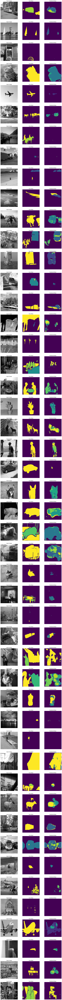

val images


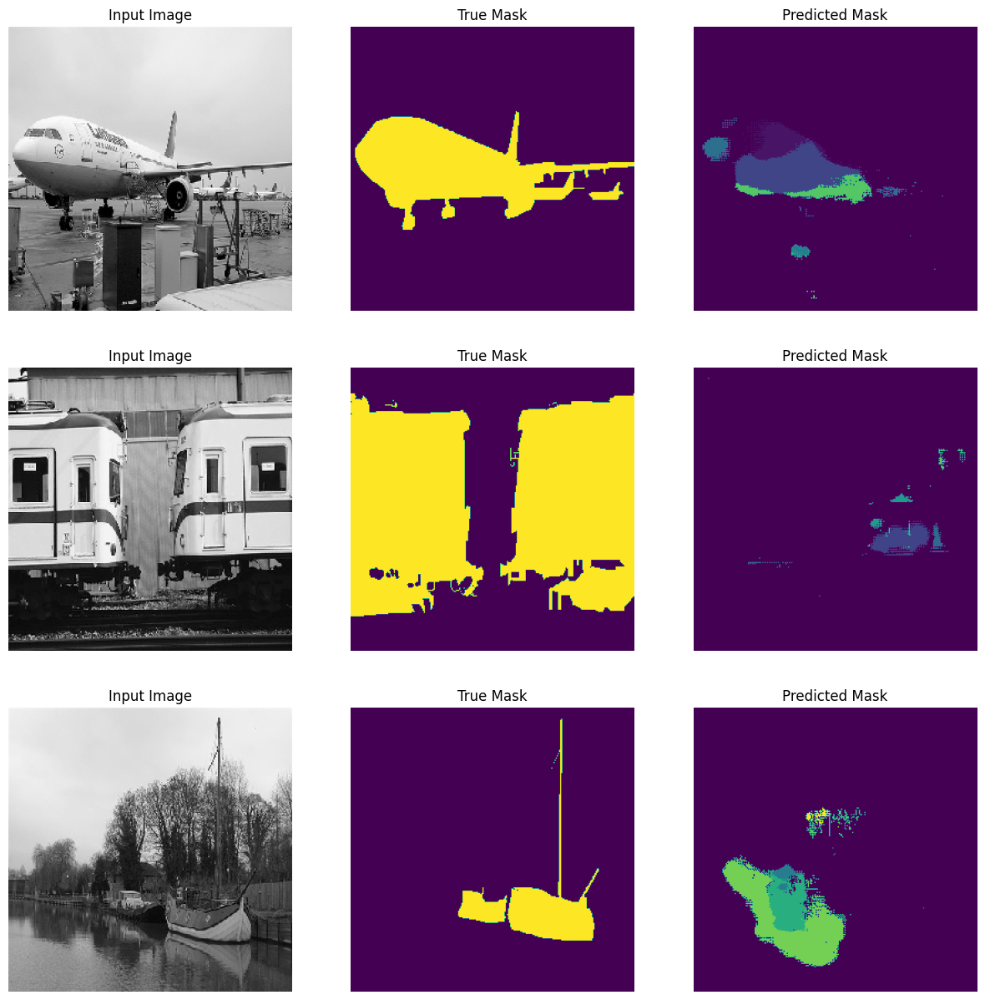

In [18]:
segmentation_model.eval()

with torch.no_grad():
    print("train images")
    for images, true_masks in seg_train_loader: 
        images = images.to(device)
        true_masks = true_masks.to(device).long()

        predicted_masks = segmentation_model(images) 

        visualize_segmentation(images.cpu(), true_masks.cpu(), predicted_masks.cpu(), num_images=48) 
        break
    print("val images")
    for images, true_masks in seg_val_loader:  # Or use seg_train_loader 
        images = images.to(device)
        true_masks = true_masks.to(device).long()

        predicted_masks = segmentation_model(images) 

        visualize_segmentation(images.cpu(), true_masks.cpu(), predicted_masks.cpu(), num_images=3) 
        break

In [13]:
from sklearn.metrics import precision_score, recall_score, f1_score
def pixel_accuracy(output, target):
    _, preds = torch.max(output, 1)
    correct = (preds == target).float()
    acc = correct.sum() / correct.numel()
    return acc

def mean_pixel_accuracy(output, target, num_classes):
    _, preds = torch.max(output, 1)
    class_accuracies = []
    for i in range(num_classes):
        class_mask = (target == i)
        class_correct = (preds[class_mask] == i).float()
        class_acc = class_correct.sum() / (class_mask.sum() + 1e-10)
        class_accuracies.append(class_acc)
    return torch.mean(torch.tensor(class_accuracies))

def precision(output, target, average='macro'):
    _, preds = torch.max(output, 1)
    preds = preds.cpu().numpy().flatten()
    target = target.cpu().numpy().flatten()
    return precision_score(target, preds, average=average, zero_division=0)

def recall(output, target, average='macro'):
    _, preds = torch.max(output, 1)
    preds = preds.cpu().numpy().flatten()
    target = target.cpu().numpy().flatten()
    return recall_score(target, preds, average=average, zero_division=0)

def f1_score_metric(output, target, average='macro'):
    _, preds = torch.max(output, 1)
    preds = preds.cpu().numpy().flatten()
    target = target.cpu().numpy().flatten()
    return f1_score(target, preds, average=average, zero_division=0)

def mean_iou(output, target, num_classes):
    _, preds = torch.max(output, 1)
    preds = preds.cpu().numpy().flatten()
    target = target.cpu().numpy().flatten()
    ious = []
    for cls in range(num_classes):
        intersection = np.logical_and(preds == cls, target == cls).sum()
        union = np.logical_or(preds == cls, target == cls).sum()
        if union == 0:
            ious.append(np.nan)  # If there is no union, set IoU for this class to NaN
        else:
            ious.append(intersection / union)
    return np.nanmean(ious)


In [14]:
segmentation_model.eval()
num_classes = 21
print("Train metrics")

with torch.no_grad():
    total_pa = 0
    total_mpa = 0
    total_precision = 0
    total_recall = 0
    total_f1 = 0
    total_miou = 0
    for images,masks in seg_train_loader:
        images = images.to(device)
        masks = masks.to(device).long()
        outputs = segmentation_model(images)
        total_pa += pixel_accuracy(outputs, masks).item()
        total_mpa += mean_pixel_accuracy(outputs, masks, num_classes).item()
        total_precision += precision(outputs, masks)
        total_recall += recall(outputs, masks)
        total_f1 += f1_score_metric(outputs, masks)
        total_miou += mean_iou(outputs, masks, num_classes) 

    avg_pa = total_pa / len(seg_train_loader)
    avg_mpa = total_mpa / len(seg_train_loader)
    avg_precision = total_precision / len(seg_train_loader)
    avg_recall = total_recall / len(seg_train_loader)
    avg_f1 = total_f1 / len(seg_train_loader)
    avg_miou = total_miou / len(seg_train_loader)

    
    print(f"PA: {avg_pa:.4f}, mPA: {avg_mpa:.4f}, "
          f"Precision: {avg_precision:.4f}, Recall: {avg_recall:.4f}, F1-Score: {avg_f1:.4f}, mIoU: {avg_miou:.4f}")
    
with torch.no_grad():
    total_pa = 0
    total_mpa = 0
    total_precision = 0
    total_recall = 0
    total_f1 = 0
    total_miou = 0
    for images,masks in seg_val_loader:
        images = images.to(device)
        masks = masks.to(device).long()
        outputs = segmentation_model(images)
        total_pa += pixel_accuracy(outputs, masks).item()
        total_mpa += mean_pixel_accuracy(outputs, masks, num_classes).item()
        total_precision += precision(outputs, masks)
        total_recall += recall(outputs, masks)
        total_f1 += f1_score_metric(outputs, masks)
        total_miou += mean_iou(outputs, masks, num_classes)
    
    avg_pa = total_pa / len(seg_val_loader)
    avg_mpa = total_mpa / len(seg_val_loader)
    avg_precision = total_precision / len(seg_val_loader)
    avg_recall = total_recall / len(seg_val_loader)
    avg_f1 = total_f1 / len(seg_val_loader)
    avg_miou = total_miou / len(seg_val_loader)
    
    print(f"PA: {avg_pa:.4f}, mPA: {avg_mpa:.4f}, "
          f"Precision: {avg_precision:.4f}, Recall: {avg_recall:.4f}, F1-Score: {avg_f1:.4f}, mIoU: {avg_miou:.4f}")

Train metrics
PA: 0.8329, mPA: 0.3107, Precision: 0.3820, Recall: 0.3138, F1-Score: 0.3070, mIoU: 0.2324
PA: 0.7166, mPA: 0.0835, Precision: 0.1315, Recall: 0.0848, F1-Score: 0.0820, mIoU: 0.0590
